In [1]:
# Import libraries

import sympy as sp
from sympy import init_printing
from sympy import pprint
import numpy as np
import math
import time
# Problem 1

theta1 = sp.symbols('theta1')
theta2 = sp.symbols('theta2')
theta3 = sp.symbols('theta3')
theta4 = sp.symbols('theta4')

# DH Transformation Matrix

def dh_matrix(theta, d, a, alpha):
    """
    Standard DH:
    A = Rot_z(theta) * Trans_z(d) * Trans_x(a) * Rot_x(alpha)
    """
    ct = sp.cos(theta)
    st = sp.sin(theta)
    ca = sp.cos(alpha)
    sa = sp.sin(alpha)

    return sp.Matrix([
        [ct, -st * ca,  st * sa, a * ct],
        [st,  ct * ca, -ct * sa, a * st],
        [0,      sa,      ca,     d],
        [0,      0,       0,      1]
    ])

# Calculate A1 to A 4

a1 = dh_matrix(theta1, 50, 0, sp.pi/2)
a2 = dh_matrix(theta2, 0, 93, 0)
a3 = dh_matrix(theta3, 0, 93, 0)
a4 = dh_matrix(theta4, 0, 50, 0)
print(f'A1: {a1}')
print(f'A2: {a2}')
print(f'A3: {a3}')
print(f'A4: {a4}')

a5 = sp.Matrix([[1, 0, 0, -15], [0, 1, 0, 45], [0, 0, 1, 0], [0, 0, 0, 1]])
init_printing(a4)

A1: Matrix([[cos(theta1), 0, sin(theta1), 0], [sin(theta1), 0, -cos(theta1), 0], [0, 1, 0, 50], [0, 0, 0, 1]])
A2: Matrix([[cos(theta2), -sin(theta2), 0, 93*cos(theta2)], [sin(theta2), cos(theta2), 0, 93*sin(theta2)], [0, 0, 1, 0], [0, 0, 0, 1]])
A3: Matrix([[cos(theta3), -sin(theta3), 0, 93*cos(theta3)], [sin(theta3), cos(theta3), 0, 93*sin(theta3)], [0, 0, 1, 0], [0, 0, 0, 1]])
A4: Matrix([[cos(theta4), -sin(theta4), 0, 50*cos(theta4)], [sin(theta4), cos(theta4), 0, 50*sin(theta4)], [0, 0, 1, 0], [0, 0, 0, 1]])


In [2]:
def forward_kinematics(forward_matrix, thetas):
    return forward_matrix.subs({theta1: thetas[0], theta2: thetas[1], theta3: thetas[2], theta4: thetas[3]})

# Calcolates T0-T1-T2-T3-T4-T5 with q configuration
def forward_kin_numeric(q):

    # Converts matrices sympy in numpy 
    subs = {theta1:q[0], theta2:q[1], theta3:q[2], theta4:q[3]}
    A1n = np.array(a1.evalf(subs=subs)).astype(np.float64)
    A2n = np.array(a2.evalf(subs=subs)).astype(np.float64)
    A3n = np.array(a3.evalf(subs=subs)).astype(np.float64)
    A4n = np.array(a4.evalf(subs=subs)).astype(np.float64)
    A5n = np.array(a5.evalf(subs=subs)).astype(np.float64)

    T0 = np.eye(4)
    T1 = A1n
    T2 = T1 @ A2n
    T3 = T2 @ A3n
    T4 = T3 @ A4n
    T5 = T4 @ A5n
    return [T0, T1, T2, T3, T4, T5]

In [3]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D # Import the 3D toolkit
import numpy as np
from matplotlib.animation import FuncAnimation
from IPython.display import HTML # For displaying in Jupyter
# Make sure your forward_kin_numeric(q) function is defined
# (as in your cell 10)

def plot_robot_config_3d(q):
    """
    Plots a 3D visualization of the robot arm for a given
    joint configuration q.
    """
    # 1. Get the 3D coordinates of each joint
    T_list = forward_kin_numeric(q)

    # p0 = origin of {0} (base)
    # p1 = origin of {1} (at joint 2)
    # p2 = origin of {2} (at joint 3)
    # p3 = origin of {3} (at joint 4)
    # p4 = origin of {4} (stylus tip)
    
    # We use the same points as the 2D plot
    p0 = T_list[0][:3, 3] # [0, 0, 0]
    p1 = T_list[1][:3, 3] # [0, 0, 50] (Joint 2)
    p2 = T_list[2][:3, 3] # (End of link 2)
    p3 = T_list[3][:3, 3] # (End of link 3)
    p4 = T_list[4][:3, 3] # (Stylus Tip)

    points_3d = np.array([
        [0, 0, 0],  # p0 - Base
        p1,         # p1 - Joint 2
        p2,         # p2 - Joint 3
        p3,         # p3 - Joint 4
        p4          # p4 - Stylus Tip
    ])

    x = points_3d[:, 0]
    y = points_3d[:, 1]
    z = points_3d[:, 2]

    # 2. Create the 3D plot
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Plot the arm links
    ax.plot(x, y, z, 'o-', c='blue', label='Arm Links')
    
    # Plot joints/markers
    ax.plot(x[0:1], y[0:1], z[0:1], 'ks', markersize=8, label='Base (Joint 1)') # Base
    ax.plot(x[1:2], y[1:2], z[1:2], 'ko', markersize=6, label='Joint 2') # Joint 2
    ax.plot(x[2:3], y[2:3], z[2:3], 'ko', markersize=6, label='Joint 3') # Joint 3
    ax.plot(x[3:4], y[3:4], z[3:4], 'ko', markersize=6, label='Joint 4') # Joint 4
    ax.plot(x[4:5], y[4:5], z[4:5], 'r*', markersize=10, label='Stylus Tip') # Tip

    # 3. Set plot properties
    ax.set_title(f"3D Robot Configuration\nq = {np.round(q, 2)}")
    ax.set_xlabel('x (mm)')
    ax.set_ylabel('y (mm)')
    ax.set_zlabel('z (mm)')
    ax.legend()

    # --- Set equal aspect ratio ---
    # This is tricky in 3D plots. A good way is to find the
    # max range and center all axes on that.
    max_range = np.array([x.max()-x.min(), y.max()-y.min(), z.max()-z.min()]).max() / 2.0
    
    mid_x = (x.max()+x.min()) * 0.5
    mid_y = (y.max()+y.min()) * 0.5
    mid_z = (z.max()+z.min()) * 0.5
    
    ax.set_xlim(mid_x - max_range, mid_x + max_range)
    ax.set_ylim(mid_y - max_range, mid_y + max_range)
    ax.set_zlim(mid_z - max_range, mid_z + max_range)
    # Note: set_zlim(0, max_range*2) might be better if you only care about z > 0
    
    plt.show()
# Make sure your forward_kin_numeric(q) function is defined
# (as in your cell 10)

def animate_robot_3d(q_list, interval=50):
    """
    Animates the robot's movement based on a list of 
    joint configurations (q_list).
    
    Args:
        q_list (list): A list where each element is a 'q' vector (e.g., [q1, q2, q3, q4])
        interval (int): Milliseconds between frames
    """
    
    # --- First, find the plot boundaries by checking all points ---
    all_points_3d = []
    for q in q_list:
        T_list = forward_kin_numeric(q)
        p1 = T_list[1][:3, 3]
        p2 = T_list[2][:3, 3]
        p3 = T_list[3][:3, 3]
        p4 = T_list[4][:3, 3]
        all_points_3d.extend([ [0,0,0], p1, p2, p3, p4 ])
    
    all_points_3d = np.array(all_points_3d)
    x, y, z = all_points_3d[:,0], all_points_3d[:,1], all_points_3d[:,2]

    # --- Set up the 3D plot ---
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, projection='3d')

    line, = ax.plot([], [], [], 'o-', c='blue', label='Arm Links')
    tip, = ax.plot([], [], [], 'r*', markersize=10, label='Stylus Tip')
    
    ax.set_title("Robot Trajectory Animation")
    ax.set_xlabel('x (mm)')
    ax.set_ylabel('y (mm)')
    ax.set_zlabel('z (mm)')
    ax.legend()

    # --- Set fixed, equal aspect ratio axes ---
    max_range = np.array([x.max()-x.min(), y.max()-y.min(), z.max()-z.min()]).max() / 2.0
    mid_x = (x.max()+x.min()) * 0.5
    mid_y = (y.max()+y.min()) * 0.5
    mid_z = (z.max()+z.min()) * 0.5
    
    ax.set_xlim(mid_x - max_range, mid_x + max_range)
    ax.set_ylim(mid_y - max_range, mid_y + max_range)
    ax.set_zlim(0, mid_z + max_range)


    # --- Define the update function for the animation ---
    def update(i):
        q = q_list[i]
        
        T_list = forward_kin_numeric(q)
        p1 = T_list[1][:3, 3]
        p2 = T_list[2][:3, 3]
        p3 = T_list[3][:3, 3]
        p4 = T_list[4][:3, 3]
        
        points_3d = np.array([ [0,0,0], p1, p2, p3, p4 ])
        
        x_frame = points_3d[:, 0]
        y_frame = points_3d[:, 1]  # <--- THIS IS THE FIX
        z_frame = points_3d[:, 2]
        
        line.set_data_3d(x_frame, y_frame, z_frame)
        tip.set_data_3d(x_frame[4:5], y_frame[4:5], z_frame[4:5])
        
        return line, tip

    # --- Create the animation ---
    ani = FuncAnimation(
        fig, 
        update, 
        frames=len(q_list), 
        interval=interval, 
        blit=False
    )

    plt.close(fig)
    
    return HTML(ani.to_jshtml())

In [4]:
# Multiply to get T0_4
t0_4 = a1 * a2 * a3 * a4


t0_5 = t0_4 * a5
# print(f'T0_4: {t0_4}')
# print(f'T0_5: {t0_5}')
T04_simpl = sp.simplify(sp.trigsimp(t0_4, recursive=True))
T05_simpl = sp.simplify(sp.trigsimp(t0_5, recursive=True))
print("T4:")
sp.pprint(T04_simpl)
print("T5:")
sp.pprint(T05_simpl)

T4:
⎡cos(θ₁)⋅cos(θ₂ + θ₃ + θ₄)  -sin(θ₂ + θ₃ + θ₄)⋅cos(θ₁)  sin(θ₁)   (93⋅cos(θ₂)  ↪
⎢                                                                              ↪
⎢sin(θ₁)⋅cos(θ₂ + θ₃ + θ₄)  -sin(θ₁)⋅sin(θ₂ + θ₃ + θ₄)  -cos(θ₁)  (93⋅cos(θ₂)  ↪
⎢                                                                              ↪
⎢    sin(θ₂ + θ₃ + θ₄)          cos(θ₂ + θ₃ + θ₄)          0        93⋅sin(θ₂) ↪
⎢                                                                              ↪
⎣            0                          0                  0                   ↪

↪ + 93⋅cos(θ₂ + θ₃) + 50⋅cos(θ₂ + θ₃ + θ₄))⋅cos(θ₁)⎤
↪                                                  ⎥
↪ + 93⋅cos(θ₂ + θ₃) + 50⋅cos(θ₂ + θ₃ + θ₄))⋅sin(θ₁)⎥
↪                                                  ⎥
↪  + 93⋅sin(θ₂ + θ₃) + 50⋅sin(θ₂ + θ₃ + θ₄) + 50   ⎥
↪                                                  ⎥
↪                   1                              ⎦
T5:
⎡cos(θ₁)⋅cos(θ₂ + θ₃ + θ₄)  -sin(θ₂ + θ₃ + θ₄)⋅cos(θ₁

In [5]:
print("Last column of T4:")
sp.pprint(T04_simpl[:, 3])
print("Last column of T5:")
sp.pprint(T05_simpl[:, 3])

Last column of T4:
⎡(93⋅cos(θ₂) + 93⋅cos(θ₂ + θ₃) + 50⋅cos(θ₂ + θ₃ + θ₄))⋅cos(θ₁)⎤
⎢                                                             ⎥
⎢(93⋅cos(θ₂) + 93⋅cos(θ₂ + θ₃) + 50⋅cos(θ₂ + θ₃ + θ₄))⋅sin(θ₁)⎥
⎢                                                             ⎥
⎢  93⋅sin(θ₂) + 93⋅sin(θ₂ + θ₃) + 50⋅sin(θ₂ + θ₃ + θ₄) + 50   ⎥
⎢                                                             ⎥
⎣                              1                              ⎦
Last column of T5:
⎡(-45⋅sin(θ₂ + θ₃ + θ₄) + 93⋅cos(θ₂) + 93⋅cos(θ₂ + θ₃) + 35⋅cos(θ₂ + θ₃ + θ₄)) ↪
⎢                                                                              ↪
⎢(-45⋅sin(θ₂ + θ₃ + θ₄) + 93⋅cos(θ₂) + 93⋅cos(θ₂ + θ₃) + 35⋅cos(θ₂ + θ₃ + θ₄)) ↪
⎢                                                                              ↪
⎢   93⋅sin(θ₂) + 93⋅sin(θ₂ + θ₃) + 35⋅sin(θ₂ + θ₃ + θ₄) + 45⋅cos(θ₂ + θ₃ + θ₄) ↪
⎢                                                                              ↪
⎣                           

In [6]:
# Problem 2

# x4 = T04_simpl[:3,0]
# o4 = T04_simpl[:3,3]

x4 = t0_4[:3, 0]
o4 = t0_4[:3, 3]

o4x = o4[0, 0]
o4y = o4[1, 0]
o4z = o4[2, 0]
# Find q1-q4


In [7]:
# import numpy as np

# def inverse_kinematics(o4x, o4y, o4z, x4z_des=0.0):
#     # --- robot constants (mm) ---
#     L1 = 50.0
#     L2 = 93.0
#     L3 = 93.0
#     L4 = 50.0

#     # 1) base joint
#     q1 = np.arctan2(o4y, o4x)
#     rho = np.hypot(o4x, o4y)

#     # 2) orientation scalar (only last component of x4^0)
#     x4z_des = float(np.clip(x4z_des, -1.0, 1.0))
#     S_candidates = [np.arcsin(x4z_des), np.pi - np.arcsin(x4z_des)]

#     sols = []

#     for S in S_candidates:
#         # 3) subtract link-4 contribution
#         rho_p = rho - L4 * np.cos(S)
#         z_p = (o4z - L1) - L4 * np.sin(S)

#         # 4) 2R IK for q2, q3
#         num = rho_p**2 + z_p**2 - L2**2 - L3**2
#         den = 2 * L2 * L3
#         c3 = num / den

#         if abs(c3) > 1.0:
#             # this S makes the point unreachable, skip
#             continue

#         s3_pos = np.sqrt(1.0 - c3**2)

#         for s3 in (s3_pos, -s3_pos):  # elbow up / elbow down
#             q3 = np.arctan2(s3, c3)

#             q2 = np.arctan2(z_p, rho_p) - np.arctan2(
#                 L3 * np.sin(q3),
#                 L2 + L3 * np.cos(q3)
#             )

#             # 5) recover q4 from S = q2 + q3 + q4
#             q4 = S - (q2 + q3)

#             sols.append(np.array([q1, q2, q3, q4]))

#     return sols

L1 = 50.0   # base offset  (d1)
L2 = 93.0   # link 2 length (a2)
L3 = 93.0   # link 3 length (a3)
L4 = 50.0   # link 4 length (a4)

def inverse_kinematics(o4x, o4y, o4z, x4z_des=0.0, tol=1e-9):
    """
    IK for your DH chain:
        A1 = DH(q1, 50, 0, pi/2)
        A2 = DH(q2, 0, 93, 0)
        A3 = DH(q3, 0, 93, 0)
        A4 = DH(q4, 0, 50, 0)
    Find all (q1,q2,q3,q4) such that:
        position = (o4x, o4y, o4z)
        and (x4^0)_z = x4z_des
    Returns a list of numpy arrays, possibly empty.
    """

    # 1) base joint from xy
    q1 = math.atan2(o4y, o4x)
    rho = math.hypot(o4x, o4y)   # horizontal distance

    # 2) orientation scalar: (x4^0)_z = sin(S)
    x4z_des = float(np.clip(x4z_des, -1.0, 1.0))
    S0 = math.asin(x4z_des)
    # two possible totals for S = q2+q3+q4
    S_candidates = (S0, math.pi - S0)

    sols = []

    for S in S_candidates:
        # 3) subtract the last link (50 mm) that is rotated by S
        # original point, seen from joint-2 plane:
        #   rho  = 93 cos q2 + 93 cos(q2+q3) + 50 cos S
        #   z    = 50 + 93 sin q2 + 93 sin(q2+q3) + 50 sin S
        # so after subtraction we get the pure 2R part:
        rho_p = rho - L4 * math.cos(S)
        z_p   = (o4z - L1) - L4 * math.sin(S)

        # 4) planar 2R IK for links L2, L3
        num = rho_p**2 + z_p**2 - L2**2 - L3**2
        den = 2.0 * L2 * L3
        if abs(den) < tol:
            continue  # degenerate, shouldn't happen here

        c3 = num / den

        # reachability with tolerance
        if c3 < -1.0 - 1e-6 or c3 > 1.0 + 1e-6:
            # this S doesn't make the point reachable
            continue

        c3 = max(min(c3, 1.0), -1.0)     # clamp
        s3_abs = math.sqrt(max(0.0, 1.0 - c3**2))

        # two elbow configurations
        for s3 in (s3_abs, -s3_abs):
            q3 = math.atan2(s3, c3)

            # shoulder (standard 2R formula)
            q2 = math.atan2(z_p, rho_p) - math.atan2(
                L3 * math.sin(q3),
                L2 + L3 * math.cos(q3)
            )

            # 5) recover q4 from S = q2 + q3 + q4
            q4 = S - (q2 + q3)

            sols.append(np.array([q1, q2, q3, q4], dtype=float))

    return sols


In [8]:
# Problem 3

R = 32  # radius
pc = np.array([150, 0, 120])  # mm

configs = []

for j in range(37):
    phi = 2*np.pi*j/36

    o4x = pc[0] + 0
    o4y = pc[1] + R*np.cos(phi)
    o4z = pc[2] + R*np.sin(phi)

    configs.append(inverse_kinematics(o4x, o4y, o4z))

# for i in configs:
#     print(i)
print(configs[0])

[array([ 0.21018259, -0.23973022,  1.66990262, -1.4301724 ]), array([ 0.21018259,  1.4301724 , -1.66990262,  0.23973022])]


In [9]:
configs_0 = [config[0] for config in configs]
configs_1 = [config[1] for config in configs]

# animate_robot_3d(configs_1, interval=100)

In [10]:
# TEST CONFIGS
num_failed = 0
num_correct = 0
for j, conf in enumerate(configs):
    conf = conf[0]
    phi = 2*np.pi*j/36
    o4x = pc[0] + 0
    o4y = pc[1] + R*np.cos(phi)
    o4z = pc[2] + R*np.sin(phi)
    T = forward_kinematics(t0_4, conf)
    o4_forward = T[:3, 3]
    o4_forward = o4_forward.T.tolist()[0]
    
    # Check if config gives correct o4 after forward kin
    o4_desired = [float(o4x), float(o4y), float(o4z)]
    print(o4_forward, o4_desired)
    if np.isclose(o4_forward, o4_desired).all():
        num_correct += 1
    else:
        num_failed += 1
        
if num_correct != len(configs):
    print("TEST FAILED")
    print(f"Correct reprojections: {num_correct}, Failed reporojections: {num_failed}")
else:
    print("TEST PASSED")


[150.000000000000, 32.0000000000000, 120.000000000000] [150.0, 32.0, 120.0]
[150.000000000000, 31.5138480963907, 125.556741685342] [150.0, 31.513848096390657, 125.55674168534178]
[150.000000000000, 30.0701638651491, 130.944644586421] [150.0, 30.07016386514907, 130.9446445864214]
[150.000000000000, 27.7128129211020, 136.000000000000] [150.0, 27.71281292110204, 136.0]
[150.000000000000, 24.5134221798073, 140.569203509969] [150.0, 24.513422179807296, 140.56920350996927]
[150.000000000000, 20.5692035099693, 144.513422179807] [150.0, 20.56920350996926, 144.5134221798073]
[150.000000000000, 16.0000000000000, 147.712812921102] [150.0, 16.000000000000004, 147.71281292110203]
[150.000000000000, 10.9446445864214, 150.070163865149] [150.0, 10.944644586421402, 150.07016386514906]
[150.000000000000, 5.55674168534177, 151.513848096391] [150.0, 5.556741685341773, 151.51384809639066]
[150.000000000000, 1.95943487863577e-15, 152.000000000000] [150.0, 1.959434878635765e-15, 152.0]
[150.000000000000, -5.

In [11]:
def compute_geometric_jacobian(T_list, frame_index=4):
    o_n = np.array(T_list[frame_index][:3, 3], dtype=float)
    J   = np.zeros((6, 4), dtype=float)

    for i in range(1, 5):  # joints 1..4
        o_im1 = np.array(T_list[i-1][:3, 3], dtype=float)   # origin of frame {i-1}
        z_im1 = np.array(T_list[i-1][:3, 2], dtype=float)   # z-axis of frame {i-1} in base
# 
        J[:3, i-1] = np.cross(z_im1, (o_n - o_im1))         # linear
        J[3:, i-1] = z_im1                                  # angular
    return J
    
def jacobian_from_angles(q, camera=False):
    T_list = forward_kin_numeric(q)
    if camera:
        return compute_geometric_jacobian(T_list, frame_index=5)
    else:
        return compute_geometric_jacobian(T_list, frame_index=4)

In [12]:


    
# Same process as Problem 3 with only 4 different phi values + Jacobian
phis = [0, np.pi/2, np.pi, 3*np.pi/2]
R = 32
pc = np.array([150, 0, 120])

for phi in phis:
    o4x = pc[0]
    o4y = pc[1] + R*np.cos(phi)
    o4z = pc[2] + R*np.sin(phi)
    q = np.array(inverse_kinematics(o4x, o4y, o4z), dtype=float)[0]

    T_list = forward_kin_numeric(q)
    J_stylus = compute_geometric_jacobian(T_list, frame_index=4)
    J_camera = compute_geometric_jacobian(T_list, frame_index=5)

    print(f"\nφ = {phi:.2f} rad ")
    print("q =", np.round(q, 4))
    print("Jacobian Stylus:\n", np.round(J_stylus, 3))
    print("Jacobian Camera:\n", np.round(J_camera, 3))



φ = 0.00 rad 
q = [ 0.2102 -0.2397  1.6699 -1.4302]
Jacobian Stylus:
 [[-32.    -68.459 -90.056  -0.   ]
 [150.    -14.605 -19.212   0.   ]
 [  0.    153.375  63.035  50.   ]
 [  0.      0.209   0.209   0.209]
 [  0.     -0.978  -0.978  -0.978]
 [  1.      0.      0.      0.   ]]
Jacobian Camera:
 [[ -28.87  -112.469 -134.065  -44.01 ]
 [ 135.33   -23.993  -28.601   -9.389]
 [   0.     138.375   48.035   35.   ]
 [   0.       0.209    0.209    0.209]
 [   0.      -0.978   -0.978   -0.978]
 [   1.       0.       0.       0.   ]]

φ = 1.57 rad 
q = [ 0.      0.1002  1.3903 -1.4904]
Jacobian Stylus:
 [[  -0.    -102.     -92.7     -0.   ]
 [ 150.      -0.      -0.       0.   ]
 [   0.     150.      57.466   50.   ]
 [   0.       0.       0.       0.   ]
 [   0.      -1.      -1.      -1.   ]
 [   1.       0.       0.       0.   ]]
Jacobian Camera:
 [[  -0.    -147.    -137.7    -45.   ]
 [ 135.      -0.      -0.      -0.   ]
 [   0.     135.      42.466   35.   ]
 [   0.       0.       0

In [13]:
# # Problem 5
# phi = np.pi/2
# o4x = pc[0]
# o4y = pc[1] + R*np.cos(phi)
# o4z = pc[2] + R*np.sin(phi)
# # print(f"o: {o4x}, {o4y}, {o4z}")

# q = np.array(inverse_kinematics(o4x, o4y, o4z), dtype=float)[0]
# # print(f"q: {q}")

# J = jacobian_from_angles(q)
# # print(f"J: {J}")
# J_inv = np.linalg.pinv(J)
# # print(f"J_inv: {J_inv}")

# eps = np.array([0, -3, 0, 0, 0, 0])
# q_p = J_inv @ eps

# print(f"q_p: {q_p}")


phi = np.pi/2
o4x = pc[0]
o4y = pc[1] + R*np.cos(phi)
o4z = pc[2] + R*np.sin(phi)

q = np.array(inverse_kinematics(o4x, o4y, o4z), dtype=float)[0]

J_geom = jacobian_from_angles(q, camera=False)
T_list = forward_kin_numeric(q)
T4 = T_list[4] 

J_v = J_geom[0:3, :]  
J_w = J_geom[3:6, :] 
x4_vec = T4[0:3, 0]

x4_x = x4_vec[0]
x4_y = x4_vec[1]

J_task_row4 = (J_w[0, :] * x4_y) - (J_w[1, :] * x4_x)

J_task = np.vstack([J_v, J_task_row4])

epsilon = np.array([0, -3, 0, 0])

# q_dot = np.linalg.solve(J_task, epsilon)
q_dot = np.linalg.inv(J_task) @ epsilon

print("q configuration:", np.round(q, 4))
print("Resulting joint velocities (q_dot):", q_dot)


q configuration: [ 0.      0.1002  1.3903 -1.4904]
Resulting joint velocities (q_dot): [-2.00000000e-02 -3.43882611e-20  4.60586672e-19 -4.26198411e-19]


In [14]:
# This is function solving the same stuff as problem 5
def calculate_joint_velocity(q, v_task_linear):

    J_geom = jacobian_from_angles(q, camera=False)
    T_list = forward_kin_numeric(q)
    T4 = T_list[4] # T_list[4] is T4

    J_v = J_geom[0:3, :]
    J_w = J_geom[3:6, :] 
    x4_vec = T4[0:3, 0]  

    x4_x = x4_vec[0]
    x4_y = x4_vec[1]

    J_task_row4 = (J_w[0, :] * x4_y) - (J_w[1, :] * x4_x)

    J_task = np.vstack([J_v, J_task_row4])

    f_dot = np.array([v_task_linear[0], v_task_linear[1], v_task_linear[2], 0.0])
    
    try:
        q_dot = np.linalg.solve(J_task, f_dot)
    except np.linalg.LinAlgError:
        print(f"Warning: Jacobian is singular at q = {q}. Using pseudo-inverse.")
        q_dot = np.linalg.pinv(J_task) @ f_dot
        
    return q_dot

#
# CELL 2: QUINTIC POLYNOMIAL SOLVER
#

def solve_quintic_coeffs(t_start, t_end, y_constraints):
    tA = t_start
    tB = t_end
    
    # The M matrix from Lecture 6, Page 27 [cite: 717]
    M = np.array([
        [1, tA, tA**2, tA**3, tA**4, tA**5],
        [0, 1, 2*tA, 3*tA**2, 4*tA**3, 5*tA**4],
        [0, 0, 2, 6*tA, 12*tA**2, 20*tA**3],
        [1, tB, tB**2, tB**3, tB**4, tB**5],
        [0, 1, 2*tB, 3*tB**2, 4*tB**3, 5*tB**4],
        [0, 0, 2, 6*tB, 12*tB**2, 20*tB**3]
    ])
    
    # Solve the system M * c = y
    c = np.linalg.solve(M, y_constraints)
    return c

In [19]:
#
# MAIN SCRIPT FOR PROBLEM 6
#

q_knots = [
    configs[0][0],   # q at j=0
    configs[9][0],   # q at j=9
    configs[18][0],  # q at j=18
    configs[27][0],  # q at j=27
    configs[36][0]   # q at j=36
]

# Define the 5 task-space linear velocities from the problem
v_knots = [
    np.array([0, 0, 0]),
    np.array([0, -27, 0]),
    np.array([0, 0, -27]),
    np.array([0, 27, 0]),
    np.array([0, 0, 0])
]

# Calculate the 5 joint velocities (qd) using our helper function
print("Calculating joint velocities at knot-points...")
qd_knots = [calculate_joint_velocity(q, v) for q, v in zip(q_knots, v_knots)]

# Define the 5 joint accelerations (qdd) from the problem
qdd_knots = [
    np.array([0, 0, 0, 0]),
    np.array([0, 0, 0, 0]),
    np.array([0, 0, 0, 0]),
    np.array([0, 0, 0, 0]),
    np.array([0, 0, 0, 0])
]

knot_states = list(zip(q_knots, qd_knots, qdd_knots))


segment_names = ['A', 'B', 'C', 'D']
all_coeffs = {}
t_start = 0.0
t_end = 2.0  #

for i in range(len(segment_names)):
    seg_name = segment_names[i]
    all_coeffs[seg_name] = []
    
    # Get the start and end state for this segment
    start_state = knot_states[i]
    end_state = knot_states[i+1]
    

    for j in range(4): # Loop 4 times (Joints q1, q2, q3, q4)
        # Build the 6-element constraint vector
        y_vec = [
            start_state[0][j],  # q(start)
            start_state[1][j],  # qd(start)
            start_state[2][j],  # qdd(start)
            end_state[0][j],    # q(end)
            end_state[1][j],    # qd(end)
            end_state[2][j]     # qdd(end)
        ]
        
        # Solve for the 6 coefficients
        c = solve_quintic_coeffs(t_start, t_end, y_vec)
        all_coeffs[seg_name].append(c)


for seg_name, joint_coeffs_list in all_coeffs.items():
    print(f"\n--- Segment {seg_name} (t in [0, 2]) ---")
    for j in range(len(joint_coeffs_list)):
        c = joint_coeffs_list[j]
        print(f"  q{j+1}(t) = {c[5]:.4f}*t^5 + {c[4]:.4f}*t^4 + {c[3]:.4f}*t^3 + {c[2]:.4f}*t^2 + {c[1]:.4f}*t + {c[0]:.4f}")



Calculating joint velocities at knot-points...

--- Segment A (t in [0, 2]) ---
  q1(t) = -0.0057*t^5 + 0.0395*t^4 + -0.0827*t^3 + 0.0000*t^2 + -0.0000*t + 0.2102
  q2(t) = 0.0113*t^5 + -0.0565*t^4 + 0.0753*t^3 + 0.0000*t^2 + 0.0000*t + 1.4302
  q3(t) = 0.0524*t^5 + -0.2622*t^4 + 0.3496*t^3 + 0.0000*t^2 + 0.0000*t + -1.6699
  q4(t) = -0.0637*t^5 + 0.3187*t^4 + -0.4249*t^3 + 0.0000*t^2 + -0.0000*t + 0.2397

--- Segment B (t in [0, 2]) ---
  q1(t) = -0.0057*t^5 + 0.0170*t^4 + 0.0073*t^3 + 0.0000*t^2 + -0.1800*t + 0.0000
  q2(t) = 0.0017*t^5 + -0.0041*t^4 + -0.0060*t^3 + 0.0000*t^2 + 0.0000*t + 1.4904
  q3(t) = -0.0113*t^5 + 0.0700*t^4 + -0.1300*t^3 + 0.0000*t^2 + 0.0000*t + -1.3903
  q4(t) = 0.0096*t^5 + -0.0659*t^4 + 0.1360*t^3 + 0.0000*t^2 + 0.0000*t + -0.1002

--- Segment C (t in [0, 2]) ---
  q1(t) = 0.0057*t^5 + -0.0395*t^4 + 0.0827*t^3 + 0.0000*t^2 + -0.0000*t + -0.2102
  q2(t) = -0.0075*t^5 + 0.0329*t^4 + -0.0323*t^3 + 0.0000*t^2 + -0.0693*t + 1.4302
  q3(t) = -0.0050*t^5 + 0.0111

In [20]:
def eval_quintic(coeffs, t):
    """
    Evaluates a quintic polynomial at time t.
    coeffs = [c0, c1, c2, c3, c4, c5]
    """
    return coeffs[0] + coeffs[1]*t + coeffs[2]*t**2 + coeffs[3]*t**3 + coeffs[4]*t**4 + coeffs[5]*t**5

def generate_trajectory_from_coeffs(all_coeffs, dt):
    """
    Generates a list of q states (robot configurations) from the
    polynomial coefficients for all segments.
    
    Args:
        all_coeffs (dict): The dictionary containing all 16 sets of 
                           coefficients (from Problem 6).
        dt (float): The time step for the output, e.g., 0.04 for 25 FPS.
        
    Returns:
        list: A list of 4x1 np.array, where each is a q-state,
              ready to be used by animate_robot_3d.
    """
    
    q_trajectory = []
    segment_names = ['A', 'B', 'C', 'D']
    segment_duration = 2.0
    total_duration = 8.0
    
    # Create an array of global time points
    t_global_array = np.arange(0, total_duration + dt, dt)
    
    for t_global in t_global_array:
        if t_global > total_duration:
            t_global = total_duration # Clamp to 8.0s
            
        # 1. Find the correct segment
        seg_index = int(t_global // segment_duration)
        if seg_index >= len(segment_names): # Handle the t_global = 8.0 case
            seg_index = len(segment_names) - 1 # Use segment 'D'
            
        seg_name = segment_names[seg_index]
        
        # 2. Calculate the local time for that segment
        t_local = t_global - (seg_index * segment_duration)
        if t_global == total_duration: # Handle the t_global = 8.0 case
             t_local = segment_duration # Use t=2.0 for the last point
             
        # 3. Calculate the q vector for this time
        q_vec = np.zeros(4)
        for j in range(4): # For each joint
            coeffs = all_coeffs[seg_name][j]
            q_vec[j] = eval_quintic(coeffs, t_local)
            
        q_trajectory.append(q_vec)
        
    return q_trajectory

In [22]:
q_list_smooth = generate_trajectory_from_coeffs(all_coeffs, dt=0.1)
animate_robot_3d(q_list_smooth, interval=40)

--- Starting Problem 7 ---
Running Forward Kinematics on 201 points...
Generating 3D comparison plot...


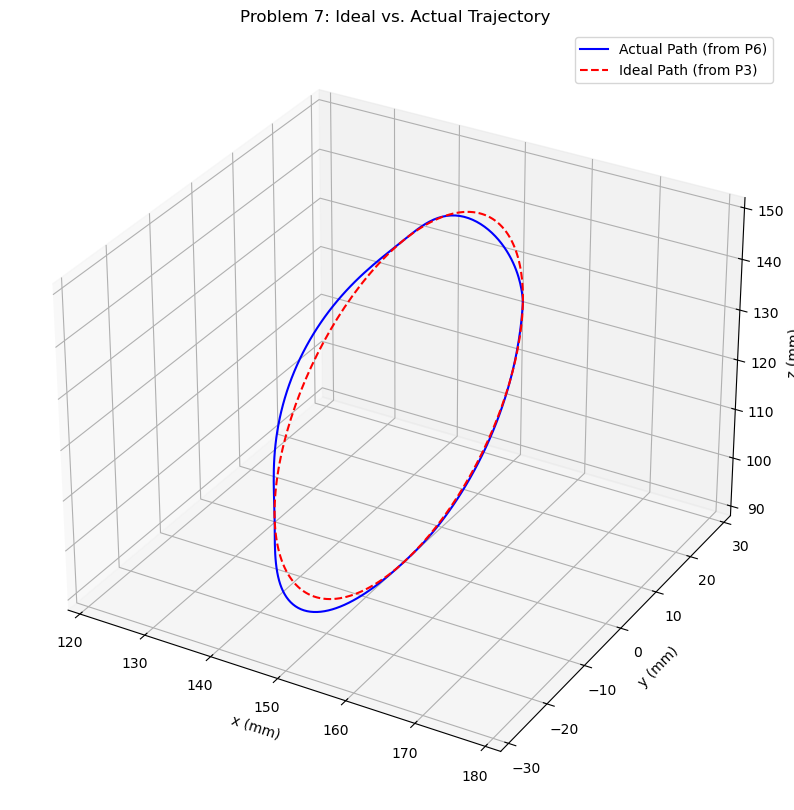

In [18]:
#
# CELL 6: SOLVING PROBLEM 7 (COMPARISON PLOT)
#
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

print("--- Starting Problem 7 ---")

# --- 1. Generate the "Actual" Path from Polynomials ---

# Get the smooth trajectory (q states) from P6 coefficients
# Use a reasonable time step (dt=0.04s for 25 FPS)
q_list_smooth = generate_trajectory_from_coeffs(all_coeffs, dt=0.04)

# Run Forward Kinematics on every q state
print(f"Running Forward Kinematics on {len(q_list_smooth)} points...")
actual_path_xyz = []
for q in q_list_smooth:
    T_list = forward_kin_numeric(q)
    pos_3d = T_list[4][:3, 3]  # Get [x, y, z] from T4
    actual_path_xyz.append(pos_3d)

# Convert from a list of vectors to a 3xN numpy array
actual_path = np.array(actual_path_xyz).T


# --- 2. Generate the "Ideal" Circular Path ---
# (Using the parameters from Problem 3)
R = 32  # radius
pc = np.array([150, 0, 120])  # mm
phi_ideal = np.linspace(0, 2*np.pi, 200)

ideal_x = pc[0] + np.zeros_like(phi_ideal)
ideal_y = pc[1] + R * np.cos(phi_ideal)
ideal_z = pc[2] + R * np.sin(phi_ideal)


# --- 3. Create the Comparison Plot ---
print("Generating 3D comparison plot...")
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')

# Plot the path from your P6 polynomials
ax.plot(actual_path[0, :], actual_path[1, :], actual_path[2, :], 'b-', label='Actual Path (from P6)')

# Plot the ideal circle
ax.plot(ideal_x, ideal_y, ideal_z, 'r--', label='Ideal Path (from P3)')

ax.set_title('Problem 7: Ideal vs. Actual Trajectory')
ax.set_xlabel('x (mm)')
ax.set_ylabel('y (mm)')
ax.set_zlabel('z (mm)')
ax.legend()

# --- Set equal aspect ratio ---
# (This is crucial for making the circle look like a circle)
max_range = np.array([
    actual_path[0,:].max() - actual_path[0,:].min(), 
    actual_path[1,:].max() - actual_path[1,:].min(), 
    actual_path[2,:].max() - actual_path[2,:].min()
]).max() / 2.0

mid_x = (actual_path[0,:].max() + actual_path[0,:].min()) * 0.5
mid_y = (actual_path[1,:].max() + actual_path[1,:].min()) * 0.5
mid_z = (actual_path[2,:].max() + actual_path[2,:].min()) * 0.5

ax.set_xlim(mid_x - max_range, mid_x + max_range)
ax.set_ylim(mid_y - max_range, mid_y + max_range)
ax.set_zlim(mid_z - max_range, mid_z + max_range)

plt.show()

<>:66: SyntaxWarning: invalid escape sequence '\p'
<>:66: SyntaxWarning: invalid escape sequence '\p'
/tmp/ipykernel_4683/3556009753.py:66: SyntaxWarning: invalid escape sequence '\p'
  ax1.set_xlabel('Angle $\phi$ (radians)')


--- Starting Problem 8 ---
Analyzing path from Problem 3...
Analyzing path from Problem 7...
Generating plots...


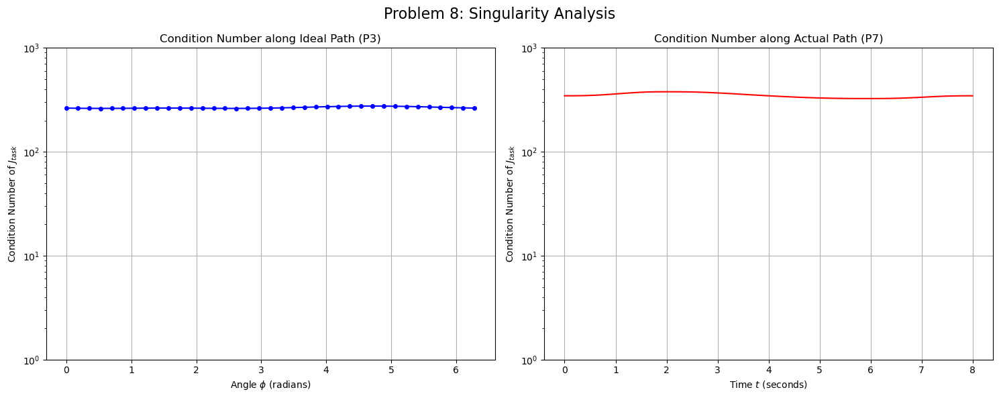

In [25]:
#
# SOLVING PROBLEM 8 (SINGULARITY ANALYSIS)
#
import numpy as np
import matplotlib.pyplot as plt

print("--- Starting Problem 8 ---")

def get_task_jacobian(q):
    """
    Calculates the 4x4 Task Jacobian for a given configuration q.
    This re-uses the logic from Problem 5.
    """
    # 1. Get the full geometric Jacobian (6x4) and T4
    J_geom = jacobian_from_angles(q, camera=False)
    T_list = forward_kin_numeric(q)
    T4 = T_list[4] # T_list[4] is T4

    # 2. Extract components
    J_v = J_geom[0:3, :]  # Linear velocity Jacobian
    J_w = J_geom[3:6, :]  # Angular velocity Jacobian
    x4_vec = T4[0:3, 0]   # x-axis of frame 4

    x4_x = x4_vec[0]
    x4_y = x4_vec[1]

    # 3. Construct the 4th row of the Task Jacobian
    J_task_row4 = (J_w[0, :] * x4_y) - (J_w[1, :] * x4_x)

    # 4. Stack J_v (3x4) and J_task_row4 (1x4)
    J_task = np.vstack([J_v, J_task_row4])
    return J_task

# --- 1. Analyze Path from Problem 3 ---
print("Analyzing path from Problem 3...")
# Use the first solution [0] for each of the 37 configurations
q_list_p3 = [conf[0] for conf in configs]
cond_numbers_p3 = []
for q in q_list_p3:
    J_task = get_task_jacobian(q)
    cond_num = np.linalg.cond(J_task) # [cite: 93]
    cond_numbers_p3.append(cond_num)

# Create the x-axis (phi) for the plot
phi_values = np.linspace(0, 2*np.pi, 37)

# --- 2. Analyze Path from Problem 7 ---
print("Analyzing path from Problem 7...")
# (Assumes 'q_list_smooth' is in memory from the previous cell)
cond_numbers_p7 = []
for q in q_list_smooth:
    J_task = get_task_jacobian(q)
    cond_num = np.linalg.cond(J_task)
    cond_numbers_p7.append(cond_num)

# Create the x-axis (time) for the plot
t_values = np.linspace(0, 8, len(q_list_smooth))

# --- 3. Plot the Results ---
print("Generating plots...")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Plot 1: Problem 3 Path
ax1.plot(phi_values, cond_numbers_p3, 'b-o', markersize=4)
ax1.set_title('Condition Number along Ideal Path (P3)')
ax1.set_xlabel('Angle $\phi$ (radians)')
ax1.set_ylabel('Condition Number of $J_{task}$')
ax1.grid(True)
ax1.set_yscale('log') # Log scale is best for condition numbers
ax1.set_ylim(1, 1000) # Set a reasonable limit

# Plot 2: Problem 7 Path
ax2.plot(t_values, cond_numbers_p7, 'r-')
ax2.set_title('Condition Number along Actual Path (P7)')
ax2.set_xlabel('Time $t$ (seconds)')
ax2.set_ylabel('Condition Number of $J_{task}$')
ax2.grid(True)
ax2.set_yscale('log')
ax2.set_ylim(1, 1000) # Use the same limit for comparison

plt.suptitle('Problem 8: Singularity Analysis', fontsize=16)
plt.tight_layout()
plt.show()

## Problem 9

In [ ]:
# Force 1 N

R = 32.0
pc = np.array([150.0, 0.0, 120.0])  # mm

def circle_point(phi):
    o4x = pc[0]
    o4y = pc[1] + R*np.cos(phi)
    o4z = pc[2] + R*np.sin(phi)
    return o4x, o4y, o4z 

def calculate_joint_torques():
    f = np.array([0, 0, -1])
    taus = []
    phis = np.linspace(0, 2*np.pi, 361)

    for phi in phis:
        o4x, o4y, o4z = circle_point(phi)
        solution = inverse_kinematics(o4x, o4y, o4z)
        q = np.array(solution[0], float)
        T_list = forward_kin_numeric(q)
        J = compute_geometric_jacobian(T_list, frame_index=4)
        J_v = J[:3, :] * 1e-3
        tau = J_v.T @ f
        taus.append(tau)

    return np.array(phis), np.array(taus)


In [ ]:
# Plotting

phis, taus = calculate_joint_torques()

plt.figure(figsize=(9,5))
labels = [r'$\tau_1$', r'$\tau_2$', r'$\tau_3$', r'$\tau_4$']
for i in range(4):
    plt.plot(phis, taus[:, i], label=labels[i])
plt.xlabel(r'$\varphi$ [rad]')
plt.ylabel('Leddmoment [N·m]')
plt.title('Momenter for 1 N ned langs $-z_0$')
plt.grid(True); plt.legend(); plt.tight_layout()
plt.show()